<h1><center>  
MC Integration and Importance Sampling </center> </h1>

### Thanoj Muddana


### Exercise 1: Compare MC Integrals

**Explain in Video** Compute two MC estimates of

$$
\theta = \int_{0}^{0.5} e^{-x}dx.
$$

a) First, generate $\hat{\theta}$ by sampling from Uniform(0, 0.5) 10000 times, and also estimate the variance of $\hat{\theta}$.  Show any math needed to create your estimator.

**Hint** set.seed(1) should give you a mean of `0.393501417048076`.

b) Second, find another MC estimator $\tilde{\theta}$ by sampling from the exponential distribution 10,000 times, and also estimate the variance of $\tilde{\theta}$. Show any math needed to create your estimator.

**Hint** set.seed(1) should give you a mean of `3.949000e-01`

c) Create a side-by-side boxplot of the 10,000 runs of these two estimators.

d) Compute the theoretical value of $\theta$.

e) Which of the variances of  $\hat{\theta}$ and $\tilde{\theta}$ is smaller. Explain using the idea of efficiency.

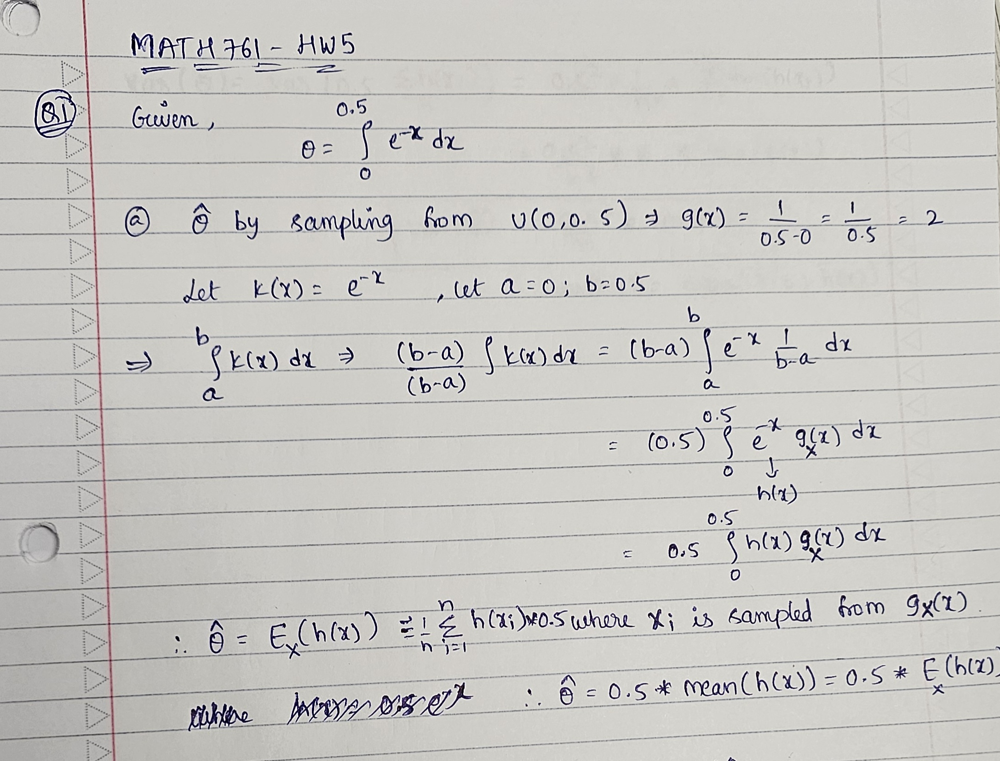
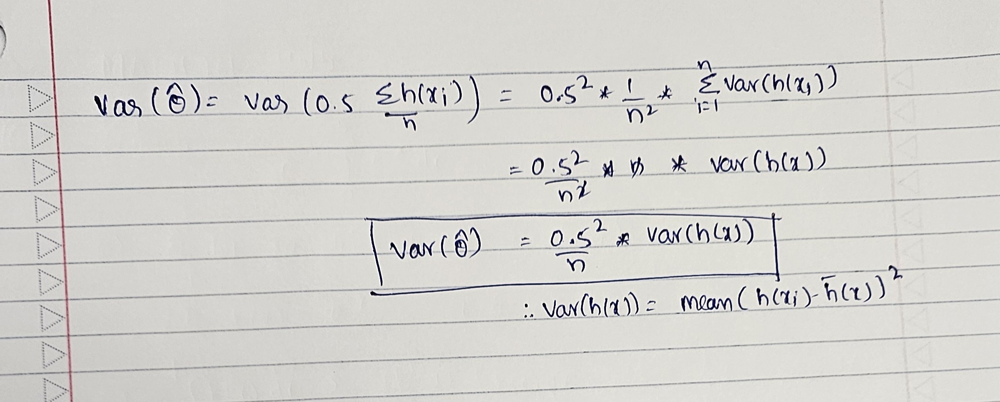



In [15]:
#parameter settings
set.seed(1)
sample_size=10000
a=0
b=0.5
h_x= function(x){
  return(exp(-x))
}
#sample from uniform 0 to 0.5
uniform_sample=runif(sample_size,a,b)

#calculate theta hat estimator
theta_hat_uniform=0.5*h_x(uniform_sample)
theta_hat=mean(0.5*h_x(uniform_sample))
cat("mean of theta_hat uniform:",theta_hat)

#calculate variance of theta hat
variance_theta_hat=(0.5^2)*mean((h_x(uniform_sample)-mean(h_x(uniform_sample)))^2)/sample_size
cat("\nvariance of theta_hat uniform:",variance_theta_hat)

mean of theta_hat uniform: 0.3935014
variance of theta_hat uniform: 3.260629e-07

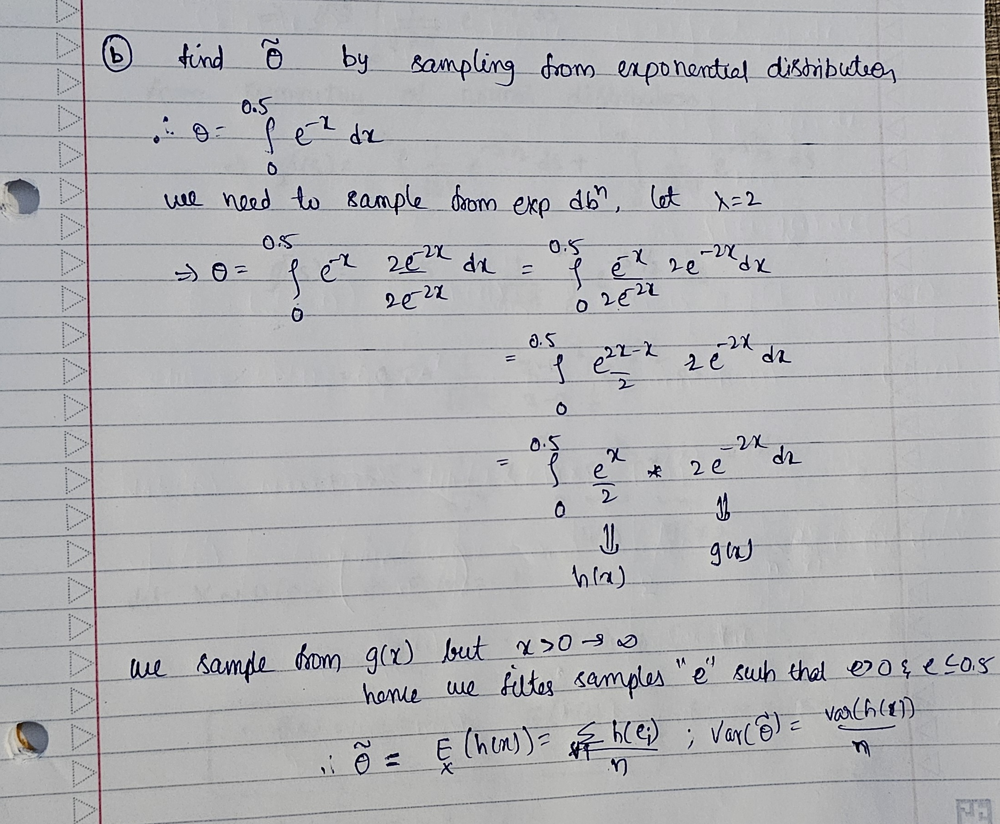

In [16]:
set.seed(1)
h_x <- function(x) {
  return((exp(x)/2))
}

# Sample from exponential distribution with lambda = 2
lambda = 2
exp_sample = rexp(sample_size, rate = lambda)
exp_sample=exp_sample[exp_sample > 0 & exp_sample < 0.5]

#theta_tilda estimator using the filtered samples
theta_tilda_exp <- h_x(exp_sample)
theta_tilda = mean(theta_tilda_exp)
cat("Mean of theta_tilda:", theta_tilda)

# variance of theta_hat
variance_theta_tilda_exp = var(theta_tilda_exp) / length(exp_sample)
cat("\nVariance of theta_tilda:", variance_theta_tilda_exp)

Mean of theta_tilda: 0.6215565


Variance of theta_tilda: 1.262624e-06

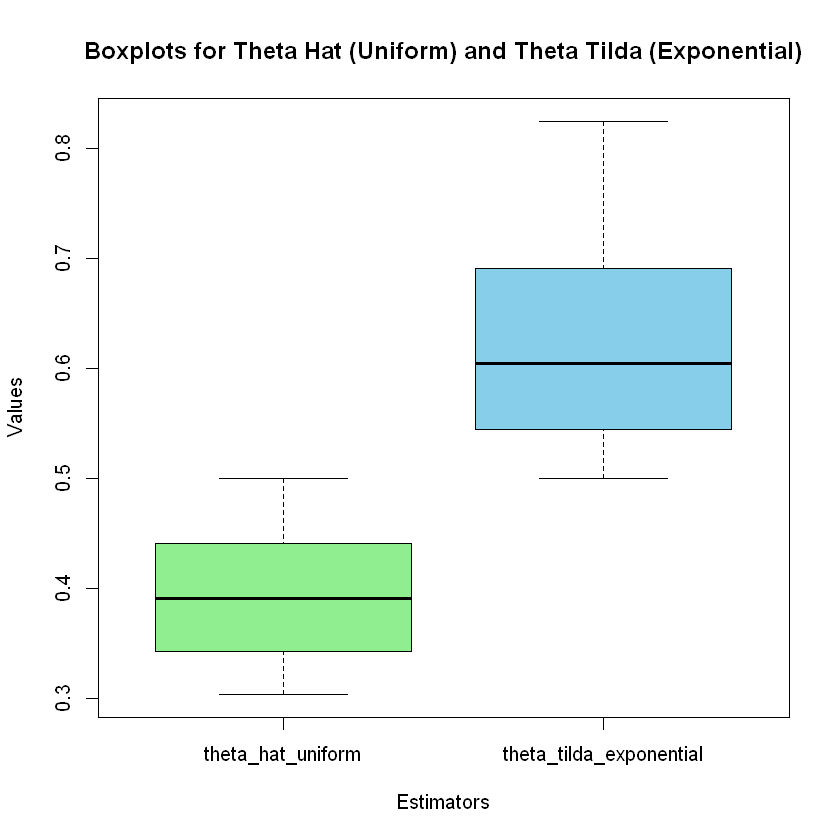

In [17]:
estimators_df <- data.frame(
  Estimator = c(rep("theta_hat_uniform", length(theta_hat_uniform)),
                rep("theta_tilda_exponential", length(theta_tilda_exp))),
  Values = c(theta_hat_uniform, theta_tilda_exp)
)

boxplot(Values ~ Estimator, data = estimators_df,
        main = "Boxplots for Theta Hat (Uniform) and Theta Tilda (Exponential)",
        xlab = "Estimators", ylab = "Values",
        col = c("lightgreen", "skyblue"))

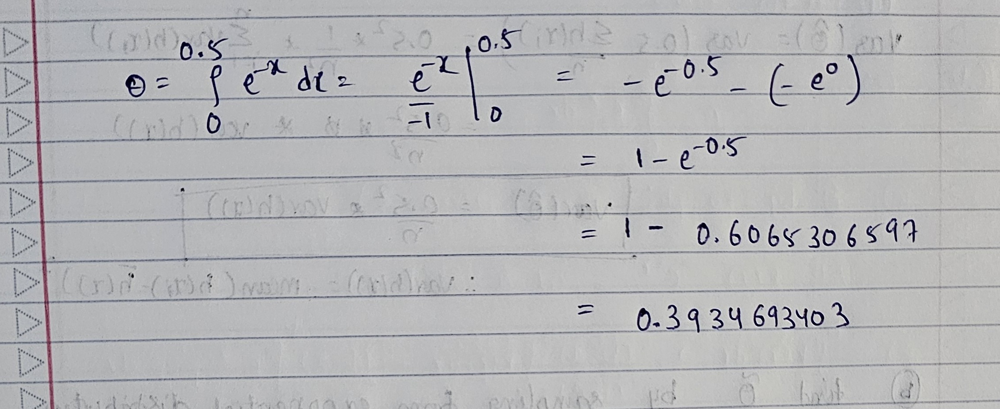

Efficiency compares the variances of different estimators, estimator with lowest variance is said be more efficient, $\\{{Var}(\hat{\theta})} < {\text{Var}(\tilde{\theta})} $, hence $\hat{\theta}$ is more efficient.

### Exercise 2: Math Manipulation

Recall from class that it is possible to create estimates of $\Phi(x)= \int_{-\infty}^x \frac{1}{\sqrt{2\pi}} e^{-s^2/2} ds$ by generating random variables from $U(0,x)$.

a) **Write-up only** Show the math that justifies how you can form an estimate of $\Phi(x)$ by using $U(0, x)$ random variables. Hint: this should look similar to the reasoning for the $U(a, b)$ example from class.

b) **Explain in Video** Estimate $\Phi(x)$ for a sequence of 10 equally spaced $x$ values from $-2.5$ to $-.1$ and 10 equally spaced $x$ values from from $.1$ to $2.5.$ Then plot these values as a line plot. Use a sample of 10,000 to estimate each integral.

**Hint** The integral for $x = -2.5$ should be `0.005611057` with SE of ` 0.006209665`.

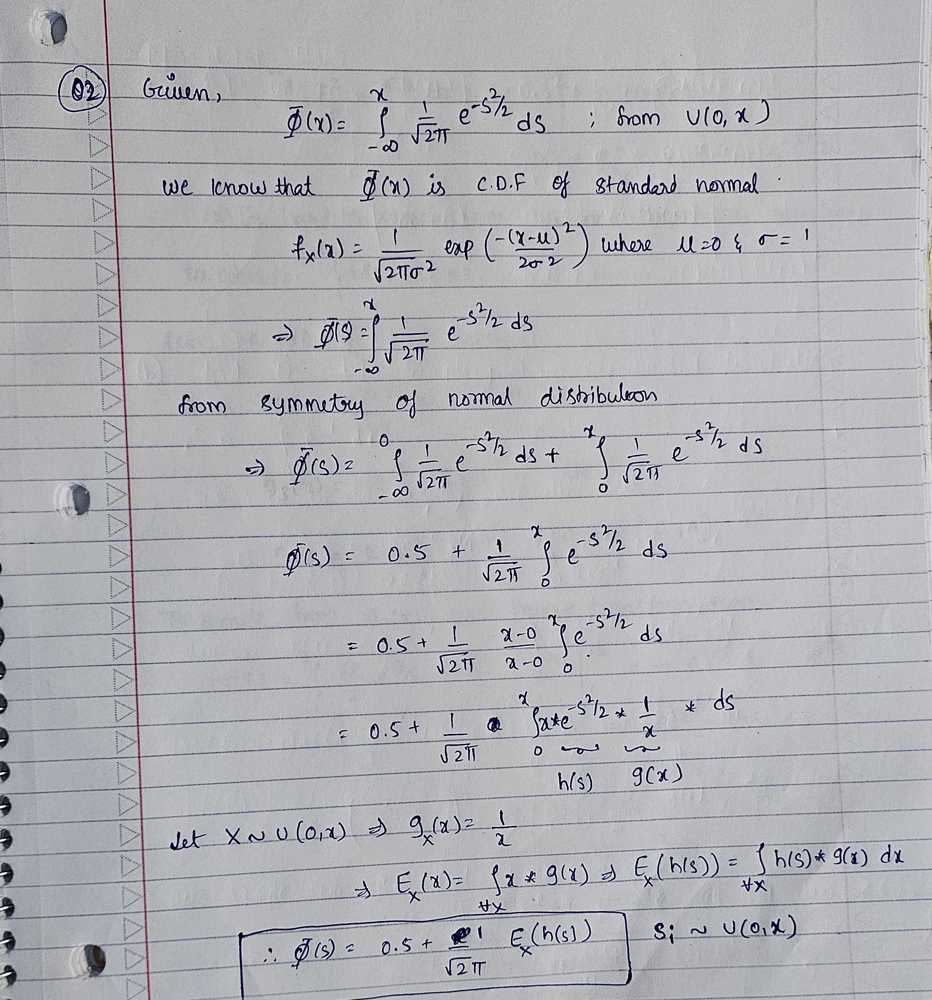

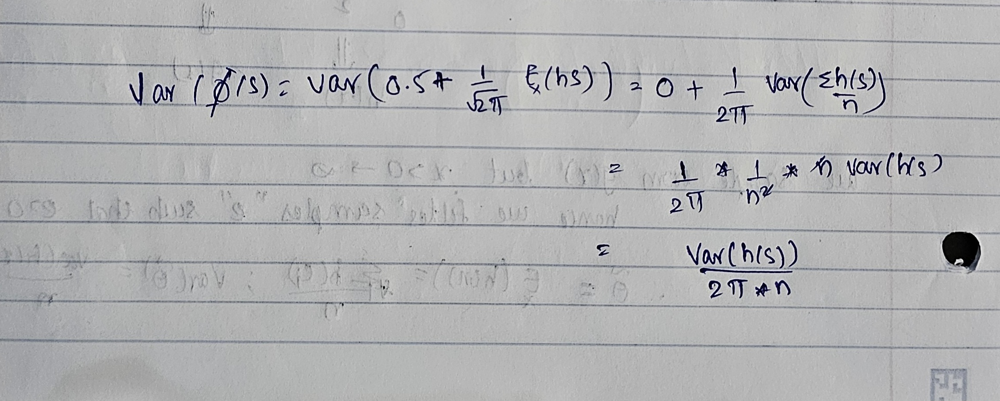

In [18]:
# Parameter settings
set.seed(1)
# Generate 10 equally spaced x values from -2.5 to -0.1 and 0.1 to 2.5
x_values_1 <- seq(-2.5, -0.1, length.out = 10)
x_values_2 <- seq(0.1, 2.5, length.out = 10)
x_values<- c(x_values_1, x_values_2)

n <- 10000

h_s <- function(x,s) {
  x*exp(-(s)^2 / 2)
}

#matrix to store results
results <- matrix(ncol = 3, nrow = length(x_values))
colnames(results) <- c("x", "phi_hat", "se")

# Loop over each x value to calculate theta_hat for each x
for (i in seq_along(x_values)) {
  x <- x_values[i]
  u=runif(n,0,abs(x))
  #theta_hat estimate
  if(x>0){
    phi_hat <- 0.5+((1 / sqrt(2 * pi)) * mean(h_s(x,u)))
  }
  #for left hand side of curve, we are sustracting the estimate with 0.5 - |x|(1/sqrt(2pi))E(h(s))
  else{
    phi_hat <- 0.5-((1 / sqrt(2 * pi)) * mean(h_s(abs(x),u)))
  }
  se <- sqrt((1 / (2 * pi)) * mean((h_s(x,u)-phi_hat)^2)) / sqrt(n)
  #store results
  results[i, ] <- c(x, phi_hat, se)
}
results_df <- as.data.frame(results)
results_df

x,phi_hat,se
<dbl>,<dbl>,<dbl>
-2.5000000,0.005611057,0.0059687868
-2.2333333,0.012984234,0.0056514280
-1.9666667,0.021034357,0.0053587653
-1.7000000,0.045085392,0.0050187788
-1.4333333,0.077761442,0.0046808901
-1.1666667,0.122100154,0.0043274090
-0.9000000,0.184151306,0.0039103338
-0.6333333,0.263252056,0.0034205294
-0.3666667,0.356921385,0.0028548404


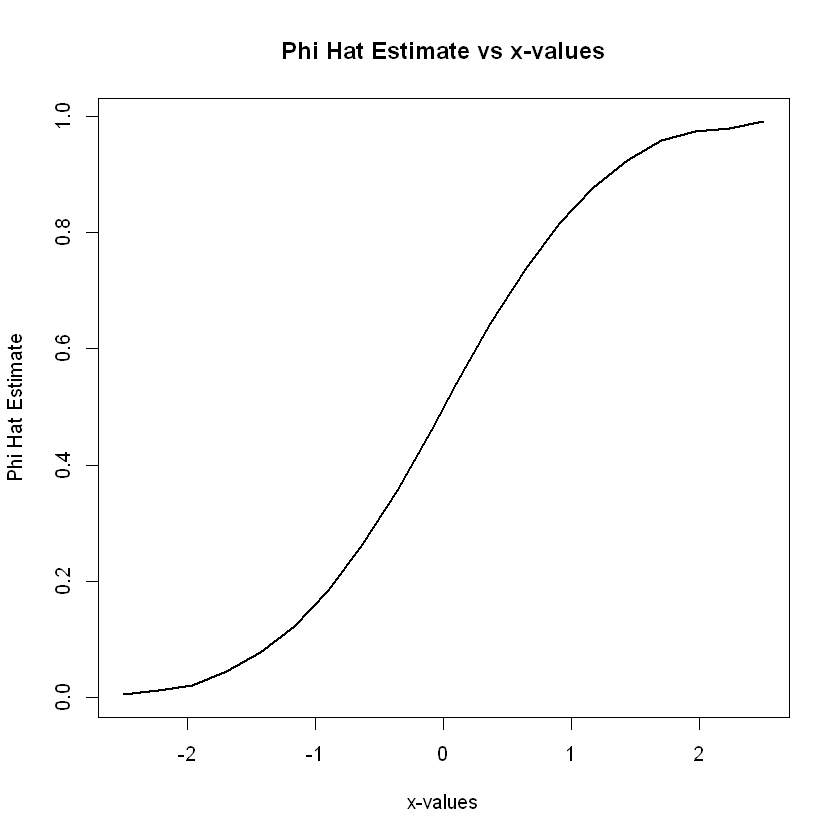

In [19]:
# Line plot comparing negative and positive x-values
plot(results_df$x, results_df$phi_hat, type = "l", col = "black", lwd = 2,xlab = "x-values", ylab = "Phi Hat Estimate", main = "Phi Hat Estimate vs x-values")


### Exercise 3: Importance Sampling


**Explain in Video** Obtain Monte Carlo estimates of
$$
\int_{1}^{\infty} \frac{x^2}{\sqrt{2\pi}}e^{-x^2/2}dx
$$
by importance sampling.

a) For this, you must try out four different importance samplers.  Please give the equations of your two functions. Also plot all four importance functions along with h(x)f(x) on a single plot.
   
b) Use all four $g_{i}(x)$ to obtain MC estimates of the integral, using a sample of 10000 for each importance function, and also report the estimated variance. Put both estimates and variances in a table. Which of your functions is best and why? Please show any math needed.



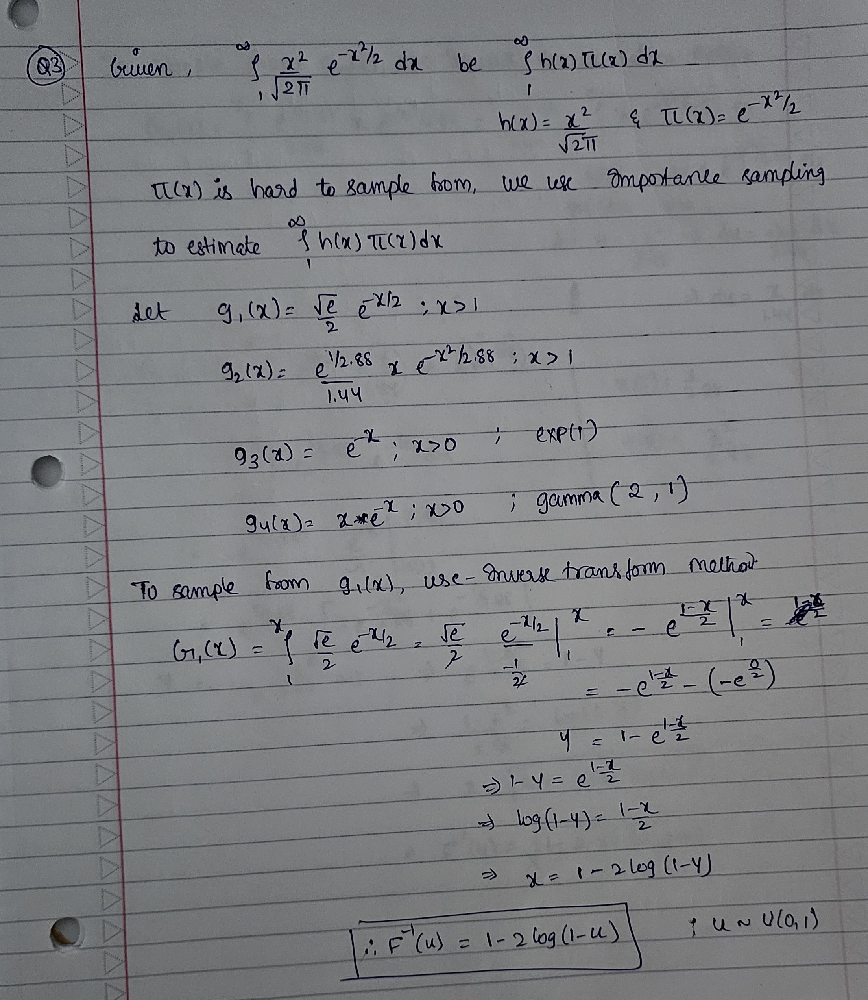

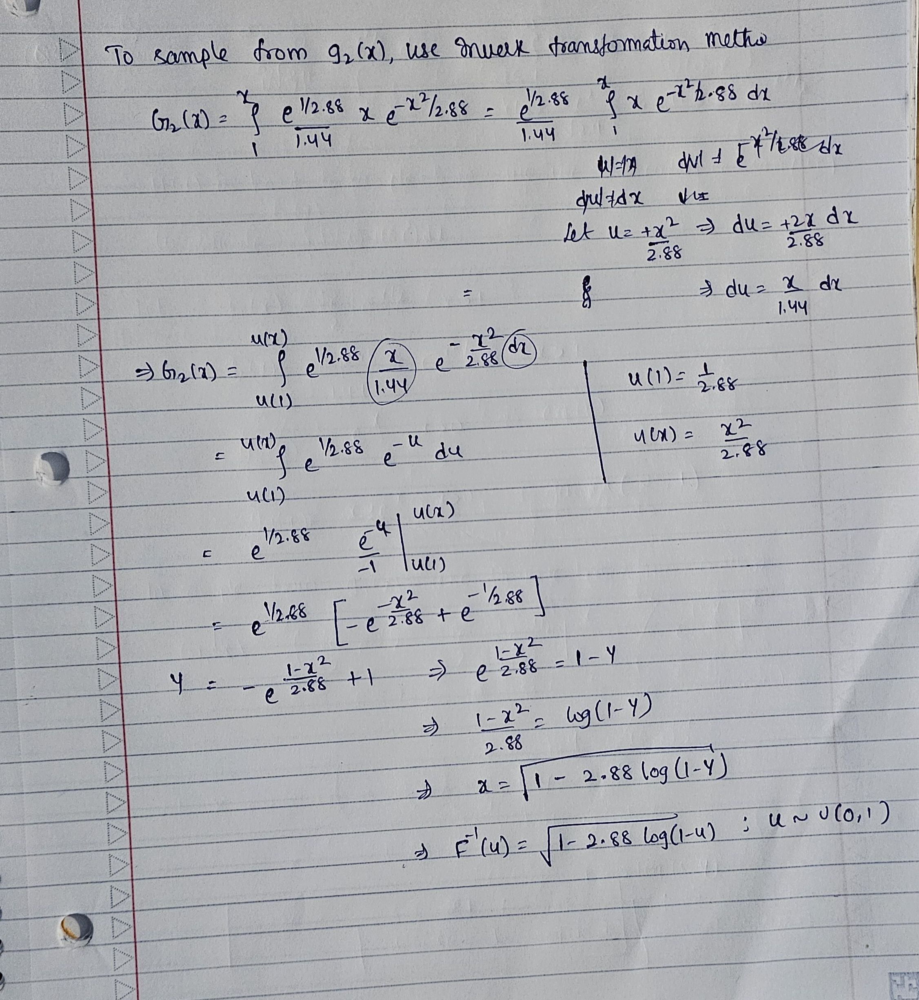

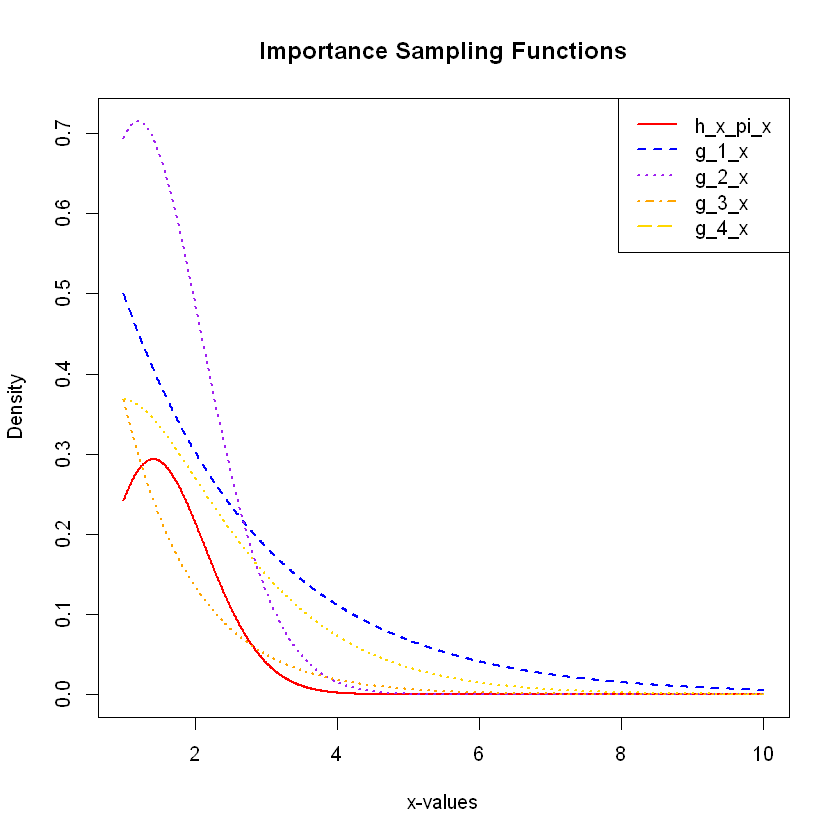

In [20]:
h_x=function(x){
  return((x^2/sqrt(2*pi)))
}
pi_x= function(x){
  return(exp(-x^2/2))
}

h_pi_x=function(x){
  return((x^2/sqrt(2*pi))*exp(-x^2/2))
}

g_1_x <- function(x) {
  return((sqrt(exp(1)) / 2) * exp(-x / 2))
}

g_2_x <- function(x) {
    return((exp(1 / 2.88) / 1.44) * x * exp(-(x^2) / 2.88))
}

g_3_x <- function(x) {
    return(exp(-x))
}
g_4_x <- function(x) {
    return(dgamma(x, shape = 2, scale = 1))
}

x_values <- seq(1, 10, length.out = 1000)
# Compute y values for each function
h_x_pi_y <- sapply(x_values, h_pi_x)
g_1_y <- sapply(x_values, g_1_x)
g_2_y <- sapply(x_values, g_2_x)
g_3_y <- sapply(x_values, g_3_x)
g_4_y <- sapply(x_values, g_4_x)
# Plot the functions
plot(x_values, h_x_pi_y, type = "l", col = "red", lwd = 2, ylim = c(0, max(h_x_pi_y, g_1_y, g_2_y,g_3_y,g_4_y)),
     xlab = "x-values", ylab = "Density", main = "Importance Sampling Functions")
lines(x_values, g_1_y, col = "blue", lwd = 2, lty = 2)
lines(x_values, g_2_y, col = "purple", lwd = 2, lty = 3)
lines(x_values, g_3_y, col = "orange", lwd = 2, lty = 3)
lines(x_values, g_4_y, col = "gold", lwd = 2, lty = 3)

legend("topright", legend = c("h_x_pi_x", "g_1_x", "g_2_x","g_3_x","g_4_x"),
       col = c("red", "blue", "purple","orange","gold"), lty = 1:5, lwd = 2)

In [21]:
#parameter settings
sample_size=10000
theta_hat=rep(NA,4)
variance_hat=rep(NA,4)

#MC estimator using g1(x)
uniform_sample=runif(sample_size)
x=1-2*log(1-uniform_sample)
theta_hat[1]=mean((h_x(x)*pi_x(x))/g_1_x(x))
variance_hat[1]=var((h_x(x)*pi_x(x))/g_1_x(x))

#MC estimator using g2(x)
uniform_sample_2=runif(sample_size)
x_2=sqrt(1-2.88*log(1-uniform_sample_2))
theta_hat[2]=mean((h_x(x_2)*pi_x(x_2))/g_2_x(x_2))
variance_hat[2]=var((h_x(x_2)*pi_x(x_2))/g_2_x(x_2))

# MC estimator using g3(x) - Exponential distribution
exp_sample = rexp(sample_size, rate = 1)
theta_hat[3] = mean((h_x(exp_sample)*pi_x(exp_sample))/g_3_x(exp_sample))
variance_hat[3] = var((h_x(exp_sample)*pi_x(exp_sample))/g_3_x(exp_sample))

# MC estimator using g4(x) - Gamma distribution
gamma_sample = rgamma(sample_size, shape = 2, scale = 1)
theta_hat[4] = mean((h_x(gamma_sample)*pi_x(gamma_sample))/g_4_x(gamma_sample))
variance_hat[4] = var((h_x(gamma_sample)*pi_x(gamma_sample))/g_4_x(gamma_sample))

results_table <- data.frame(
  Importance_Function = c("g_1(x)", "g_2(x)", "g_3(x)", "g_4(x)"),
  Theta_Hat_Estimate = theta_hat,
  Variance = variance_hat
)

print(results_table)

  Importance_Function Theta_Hat_Estimate    Variance
1              g_1(x)          0.4054110 0.090801507
2              g_2(x)          0.4006413 0.003088895
3              g_3(x)          0.5081724 0.291034452
4              g_4(x)          0.5025652 0.090242081


Goal of importance sampling is to minimize variance of the estimator, g2(x) has the lowest variance of 0.0029, which makes it the best choice among these four importance functions. Lower variance indicates that the estimates are more stable and accurate.